In [845]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from pathlib import Path
import scanpy as sc
import geopandas as gpd
from sklearn_ann.kneighbors.annoy import AnnoyTransformer
# to install %pip install -q "scanpy" "sklearn-ann[annoy]"
import matplotlib.pyplot as plt
import scanpy.external as sce
import random
import matplotlib.colors as mcolors
import pandas as pd
import seaborn as sns

TODO:

1. Make QC figures of the data - Per cell and gene count distribution, for each slide, for each section
2. Find a good figure of the immune score and cd74
3. 

In [557]:
# set global seed
SEED = 1337
random.seed(SEED)

In [558]:
segmentation_path = Path("/Users/janzules/Roselab/Spatial/dietary_project/data/segmented_data/")
adata_file     = segmentation_path / "combined_adata.h5ad"
geneList = segmentation_path / "Gene_lists"
fig_out = Path("/Users/janzules/Roselab/Spatial/dietary_project/figures/cell_segmentation_result_analysis/Improving_clustering/")
ST_sample_org = sc.read_h5ad(adata_file)

# Processing data

In [789]:
# parameter choices
min_UMI = 200
n_cells = 40000 # Random choice
HVG_num = 2000 #default 2k

In [790]:
# Cleaning
# Identify mitochondrial genes (prefix 'MT-' for human)
ST_sample_org.var['mito'] = ST_sample_org.var_names.str.startswith('mt-')

#  Run QC metrics
sc.pp.calculate_qc_metrics(
    ST_sample_org, 
    qc_vars=['mito'], 
    inplace=True, 
    log1p=False
)

In [791]:
sc.pp.filter_genes(ST_sample_org, min_cells=10)
# sc.pp.filter_cells(ST_sample_org, min_genes = 100)
ST_sample_org = ST_sample_org[
    (ST_sample_org.obs['total_counts'] >= min_UMI) &
    (ST_sample_org.obs['pct_counts_mito'] <= 15)
].copy()

# Sub_sampling_profiling


In [792]:
subset_PTEN = ST_sample_org[ST_sample_org.obs['sample_id'].isin(['F07833', 'F07834', 'F07835', 'F07836','F07838', 'F07837'])].copy()
# subset_PTEN = ST_sample_org[ST_sample_org.obs['sample_id'].isin(['F07838', 'F07837'])].copy()#'F07833', 'F07834', 'F07835', 'F07836',

In [793]:
# Random cells - 3k
# rng = np.random.RandomState(SEED)
# rng.choice(100, 10, replace=False)
# n_cells = 40000
if subset_PTEN.n_obs > n_cells:
    selected_indices = np.random.choice(subset_PTEN.n_obs, n_cells, replace=False)
    ST_sample = subset_PTEN[selected_indices, :].copy()

# ST_sample.obs['id']

In [794]:
ST_sample.obs['sample_id'].unique()

['F07838', 'F07833', 'F07835', 'F07837', 'F07834', 'F07836']
Categories (6, object): ['F07833', 'F07834', 'F07835', 'F07836', 'F07837', 'F07838']

## QC Figures

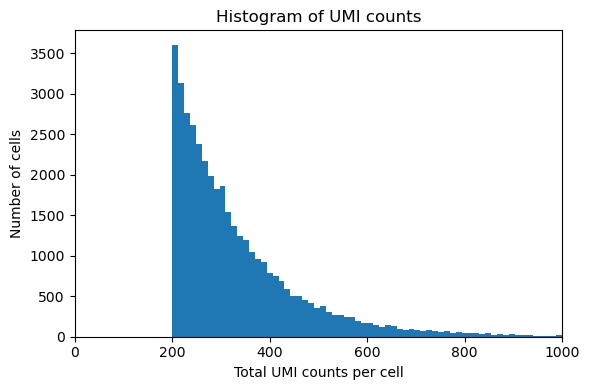

In [795]:
plt.figure(figsize=(6,4))
plt.hist(ST_sample.obs['total_counts'], bins=400)
# plt.yscale('log')              # log y‐axis to see the tail more clearly
plt.xlabel('Total UMI counts per cell')
plt.ylabel('Number of cells')
plt.title('Histogram of UMI counts')
plt.xlim(0, 1000) 
plt.tight_layout()
plt.show()

In [796]:
ST_sample_org.shape

(280907, 18326)

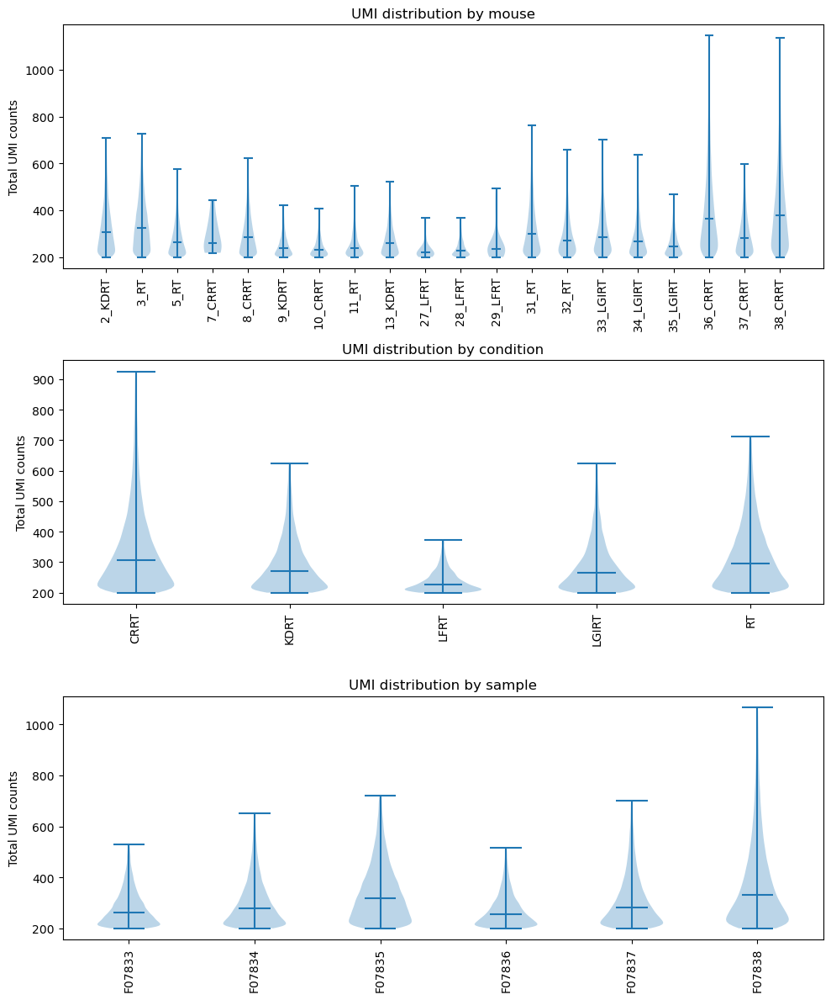

In [797]:
# Prepare filtered data to remove high outliers per group
# df = ST_sample.obs[['total_counts', 'mouse', 'condition', 'sample_id']].copy()
df = ST_sample_org.obs[['total_counts', 'mouse', 'condition', 'sample_id']].copy()

# Drop outliers per grouping level
def filter_outliers(group_col):
    thresholds = df.groupby(group_col, observed=False)['total_counts'].quantile(0.98)
    return df[df.apply(lambda row: row['total_counts'] <= thresholds[row[group_col]], axis=1)]

df_mouse = filter_outliers('mouse')
df_condition = filter_outliers('condition')
df_sample = filter_outliers('sample_id')

# Build subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 12), sharey=False)

# Panel 1: grouped by mouse
mouse_order = df_mouse['mouse'].cat.categories if df_mouse['mouse'].dtype.name == 'category' else sorted(df_mouse['mouse'].unique())
data_mouse = [df_mouse.loc[df_mouse['mouse'] == m, 'total_counts'] for m in mouse_order]
axes[0].violinplot(data_mouse, showmedians=True)
axes[0].set_xticks(range(1, len(mouse_order)+1))
axes[0].set_xticklabels(mouse_order, rotation=90)
axes[0].set_title('UMI distribution by mouse')

# Panel 2: grouped by condition
cond_order = df_condition['condition'].cat.categories if df_condition['condition'].dtype.name == 'category' else sorted(df_condition['condition'].unique())
data_condition = [df_condition.loc[df_condition['condition'] == c, 'total_counts'] for c in cond_order]
axes[1].violinplot(data_condition, showmedians=True)
axes[1].set_xticks(range(1, len(cond_order)+1))
axes[1].set_xticklabels(cond_order, rotation=90)
axes[1].set_title('UMI distribution by condition')

# Panel 3: grouped by sample_id
sample_order = df_sample['sample_id'].cat.categories if df_sample['sample_id'].dtype.name == 'category' else sorted(df_sample['sample_id'].unique())
data_sample = [df_sample.loc[df_sample['sample_id'] == s, 'total_counts'] for s in sample_order]
axes[2].violinplot(data_sample, showmedians=True)
axes[2].set_xticks(range(1, len(sample_order)+1))
axes[2].set_xticklabels(sample_order, rotation=90)
axes[2].set_title('UMI distribution by sample')

# Final formatting
for ax in axes:
    ax.set_ylabel('Total UMI counts')

plt.tight_layout()
plt.show()


# Scoring and Regressing out

## Scoring

In [798]:
# Saving count data
ST_sample.layers["counts"] = ST_sample.X.copy()

In [799]:
#Cell-cycle scoring
with open(f"{geneList}/cc_mouse_cycle_genes.json") as jf:
    cc = json.load(jf)
s_genes_mouse   = cc["s_genes"]
g2m_genes_mouse = cc["g2m_genes"]


sc.tl.score_genes_cell_cycle(
    ST_sample,
    s_genes   = s_genes_mouse,
    g2m_genes = g2m_genes_mouse,
    use_raw   = False
)

In [800]:
# # Immune scoring
# immune_genes = [
#     # T cells
#     "Cd3e",   # pan-T cell marker (TCR complex)
#     "Cd4",    # CD4+ T helper cells
#     "Cd8a",   # CD8+ cytotoxic T cells
#     "Foxp3",  # regulatory T cells (Tregs)
#     "Pdcd1",  # exhausted T cells (PD-1)
#     "Ctla4",  # inhibitory receptor, Tregs, exhausted T cells
#     "Ptprc"   # CD45

#     # NK cells
#     "Ncr1",   # NK cell activating receptor
#     "Prf1",   # perforin (cytotoxic granule, NK and CD8 T cells)
#     "Gzmb",   # granzyme B (cytotoxic granule, NK and CD8 T cells)
#     "Ifng",   # interferon-gamma (produced by NK and T cells)

#     # B cells
#     "Cd79a",  # B-cell receptor complex
#     "Cd19",   # pan-B cell marker
#     "Ms4a1",  # CD20 (B-cell marker)

#     # Macrophages / Monocytes
#     "Adgre1", # F4/80 (macrophage marker)
#     "Itgam",  # CD11b (macrophages, monocytes, neutrophils)
#     "Csf1r",  # macrophage colony-stimulating factor receptor
#     "Mrc1",   # CD206, M2 macrophages (pro-tumor TAMs)

#     # Dendritic cells (DCs)
#     "Itgax",  # CD11c (dendritic cells)
#     "H2-Ab1", # MHC class II (antigen presentation, DCs, macrophages)
#     "Cd74",   # invariant chain for MHC II (antigen presentation)

#     # MDSC / Neutrophils
#     "Ly6g",   # neutrophils, granulocytic-MDSCs
#     "S100a8", # neutrophils, MDSCs
#     "S100a9", # neutrophils, MDSCs
#     "Nos2",   # M1 macrophages, anti-tumor, nitric oxide synthase
#     "Arg1",   # M2 macrophages, immunosuppressive MDSCs

#     # Mast cells
#     "Kit",    # stem cell factor receptor (mast cells)
#     "Fcer1a", # high-affinity IgE receptor (mast cells)
#     "Cpa3",   # mast cell-specific protease

#     # General inflammatory mediators
#     "Il1b",   # pro-inflammatory cytokine (macrophages, neutrophils)
#     "Tnf"     # tumor necrosis factor alpha (broad immune activation)
# ]
# len(immune_genes)

In [801]:
# ───────────────────────────────────────────────────────────────────────────────
# Mouse immune-cell marker panel for spatial transcriptomics
# (focus on prostate-tumour micro-environment: T/NK/B cells, macrophage
#  polarization, neutrophils / MDSCs, dendritic-cell subsets, mast cells,
#  innate-like lymphocytes, cytotoxic / checkpoint / chemokine axes)
# ───────────────────────────────────────────────────────────────────────────────

immune_genes = [

    # -------------------------------------------------------------------------
    # General pan-leukocyte
    "Ptprc",      # CD45
    "Itgb2", "Itgax", "Itgam",  # β2 integrins (CD18, CD11c, CD11b)

    # -------------------------------------------------------------------------
    # Conventional αβ T cells
    "Cd3d", "Cd3e", "Cd3g", "Cd247",             # TCR complex
    "Trac", "Trbc1", "Trbc2",                    # TCR chains
    "Cd4",                                       # CD4 Th
    "Cd8a", "Cd8b1",                             # CD8 CTL
    "Foxp3", "Il2ra",                            # Treg
    "Pdcd1", "Ctla4", "Lag3", "Havcr2", "Tigit", # exhaustion / checkpoint
    "Tcf7", "Sell",                              # naïve / stem-like
    "Ifng", "Gzmb", "Prf1", "Gzma", "Gzmk",      # effector molecules

    # γδ T cells & innate-like T
    "Trdc", "Trdv2", "Trgv4",                    # γδ chains
    "Cd69", "Il17a", "Rorc",                     # IL-17-producing γδ subset

    # -------------------------------------------------------------------------
    # Natural-killer cells
    "Ncr1", "Nkg7", "Klrb1c",              # NKp46, NKG7, NK1.1
    "Klrc1", "Klrc2", "Klrd1",            # NKG2 family
    "Eomes", "Tbx21",                     # transcription factors
    "Cxcr6",                              # tissue-resident NK / ILC1

    # Natural-killer T (NKT) / MAIT
    "Trav11", "Traj18", "Zbtb16",         # type-I NKT TCRα (Vα14-Jα18), PLZF
    "Mr1",                                # MAIT-restricting molecule
    "Trav1", "Traj33",                    # MAIT TCRα Vα19-Jα33

    # -------------------------------------------------------------------------
    # B-cell & plasma-cell
    "Cd19", "Cd79a", "Cd79b", "Ms4a1",          # pan-B (CD19, BCR, CD20)
    "Cd74", "H2-Ab1", "H2-Eb1",                 # MHC-II
    "Mzb1", "Ighm", "Ighd", "Jchain",           # plasma-cell differentiation
    "Prdm1", "Xbp1",                            # Blimp1, XBP1 – plasmablast

    # -------------------------------------------------------------------------
    # Monocytes / macrophages
    # Core markers
    "Adgre1",   # F4/80
    "Csf1r",    # colony-stim. factor receptor
    "Aif1",     # Iba1
    # Polarisation / TAM flavour
    "Nos2", "Il1b", "Tnf", "Cxcl9",             # classically activated (M1-like)
    "Mrc1", "Arg1", "Chil3", "Retnla", "Il10",  # alternative (M2 / immunosuppressive)
    # Phagocytosis & antigen presentation
    "Fcgr1", "Fcgr3", "Cd68", "Lgals3",
    # Chemokine cues
    "Ccl2", "Ccl7", "Ccl8", "Ccl12",

    # -------------------------------------------------------------------------
    # Neutrophils / granulocytic-MDSCs
    "Ly6g", "Ly6c2", "S100a8", "S100a9", "Camp",
    "Mpo", "Elane", "Ltf", "Ngp", "Clec4d", "Clec4e",
    "Cxcr2", "Cxcr4",

    # -------------------------------------------------------------------------
    # Dendritic-cell landscape
    # cDC1 (cross-presenting, anti-tumour)
    "Xcr1", "Clec9a", "Batf3", "Irf8",
    # cDC2 (antigen presentation to CD4, IL-12)
    "Cd209a", "Sirpa", "Irf4", "Tmem176b",
    # pDC
    "Siglech", "Bst2", "Irf7", "Tcf4",
    # Langerhans / migratory DC
    "Langerin", "Mfge8",
    # Monocyte-derived DC / inflammatory DC
    "Ly6c1", "Ccr2", "Tnf",
    # Activation / costimulation
    "Cd86", "Cd40", "Il12b",

    # -------------------------------------------------------------------------
    # Mast cells / basophils / eosinophils
    "Kit", "Fcer1a", "Cpa3", "Mcpt1", "Mcpt4",  # mast
    "Prss34", "Alox15",                         # basophil / eosinophil
    "Siglecf", "Ear2", "Il5ra",                 # eosinophil

    # -------------------------------------------------------------------------
    # Innate lymphoid cells (ILC)
    "Rorc", "Il22", "Areg",       # ILC3
    "Gata3", "Il5", "Il13",       # ILC2
    "Tbx21", "Ifng",              # ILC1

    # -------------------------------------------------------------------------
    # Chemokine & cytokine axes (help disentangle niches)
    "Ccl5", "Cxcl10", "Cxcl13", "Ccl17", "Ccl22",
    "Il7", "Il15", "Il12a", "Il12b", "Tgfb1",

    # -------------------------------------------------------------------------
    # Immune checkpoints & costim beyond PD-1 / CTLA-4
    "Cd274",  # PD-L1
    "Pdcd1lg2",  # PD-L2
    "Cd80", "Cd86",
    "Tnfrsf9",   # 4-1BB
    "Icos",      # ICOS
    "Cd27", "Cd70",
    "Tnfrsf4",   # OX40
    "Tnfsf4",    # OX40L
    "Entpd1",    # CD39 (adenosine axis)
    "Nt5e",      # CD73
]

# Remove any genes absent from your data to avoid warnings
immune_genes_present = [g for g in immune_genes if g in ST_sample.var_names]

print(f"{len(immune_genes_present)} / {len(immune_genes)} genes found in dataset.")


142 / 155 genes found in dataset.


In [802]:
# core_immune_genes = ["Ptprc", "Cd3e", "Cd4" "Cd79a", "Itgam", "Ly6g", "Ncr1", "Arg1", "H2-Abl", "Adgre1", "Mrcl", "Nos2", "csflr"]

core_immune_genes = [g for g in immune_genes_present if g in ST_sample.var_names]
sc.tl.score_genes(
    ST_sample,
    gene_list=core_immune_genes,
    score_name="Immune_score",
    ctrl_size=len(core_immune_genes)
)

In [803]:

# pten genes from Glaviano et al. 2023
pten_downstream_genes = [
    # PI3K → AKT → mTOR core cascade
    "Pik3ca",  # PI3K catalytic subunit alpha
    "Pik3cb",  # PI3K catalytic subunit beta
    "Pik3cd",  # PI3K catalytic subunit delta
    "Pik3cg",  # PI3K catalytic subunit gamma
    "Akt1",    # AKT serine/threonine kinase 1
    "Akt2",    # AKT serine/threonine kinase 2
    "Akt3",    # AKT serine/threonine kinase 3
    "Mtor",    # mechanistic target of rapamycin (mTOR)

    # Direct AKT substrates / pathway read-outs
    "Foxo1",   # Forkhead box O1 (transcription factor, inhibited by AKT)
    "Foxo3",   # Forkhead box O3 (transcription factor, inhibited by AKT)
    "Gsk3b",   # Glycogen synthase kinase 3 beta (inhibited by AKT)
    "Bad",     # BCL2-associated agonist of cell death (pro-apoptotic, inhibited by AKT)
    "Mdm2",    # E3 ubiquitin-protein ligase Mdm2 (p53 regulation, activated by AKT)
    "Tsc2",    # Tuberous sclerosis complex 2 (TSC complex, inhibited by AKT)
    "Cdkn1a",  # Cyclin-dependent kinase inhibitor 1A (p21, AKT-regulated)
    "Cdkn1b",  # Cyclin-dependent kinase inhibitor 1B (p27, AKT-regulated)

    # mTORC1 translational targets
    "Rps6kb1", # Ribosomal protein S6 kinase beta-1 (S6K1, downstream of mTORC1)
    "Eif4ebp1",# Eukaryotic translation initiation factor 4E binding protein 1 (4E-BP1)
    "Rps6",    # Ribosomal protein S6 (target of S6K1 phosphorylation)

    # Cell-cycle & growth genes induced downstream
    # "Myc",     # MYC proto-oncogene (cell growth, proliferation)
    "Ccnd1",   # Cyclin D1 (G1/S cell cycle transition)
    "Cdk4",    # Cyclin-dependent kinase 4 (partners with Cyclin D)
    "Cdk6",    # Cyclin-dependent kinase 6 (partners with Cyclin D)
    "Vegfa",   # Vascular endothelial growth factor A (angiogenesis, upregulated by mTOR-HIF1A)
    "Hif1a",   # Hypoxia-inducible factor 1-alpha (upregulated downstream of mTOR)

    # Anti-/pro-apoptotic balance
    "Bcl2",    # B-cell lymphoma 2 (anti-apoptotic)
    "Mcl1",    # Myeloid cell leukemia 1 (anti-apoptotic)
    "Bax",     # BCL2 associated X, apoptosis regulator (pro-apoptotic)
    "Bak1"     # BCL2 antagonist/killer 1 (pro-apoptotic)
]
present_pten = [g for g in pten_downstream_genes if g in ST_sample.var_names]

# based on CHI V. DANG* 1999 - mini review of myc genes
myc_growth     = ["Myc","Ccna2", "Ccnd1", "Ccne1", "Cdk1", "Cdc25a", "Rcc1", "Odc1", "Tert", "Tk1"]
myc_survival   = ["Cdkn2a", "Trp53", "Bax"]
myc_metabolism = ["Ldha", "Cad", "Dhfr", "Eif2s1", "Eif4e", "Rida"]
myc_cap_genes  = myc_growth + myc_survival + myc_metabolism

# 2) compute module scores on the normalized log1p data
sc.tl.score_genes(
    ST_sample,
    gene_list=present_pten,
    score_name="PTENSKO_score",
    ctrl_size = len(present_pten)
)

sc.tl.score_genes(
    ST_sample,
    gene_list=myc_cap_genes,
    score_name="MycCAP_score"
)

In [804]:
# HVG selection
sc.pp.highly_variable_genes(
    ST_sample,
    n_top_genes= HVG_num, #default 2k
    flavor="seurat_v3",
    # batch_key="TMA"
)

ST_sample.var['highly_variable'] |= ST_sample.var_names.isin(immune_genes_present)
ST_sample = ST_sample[:, ST_sample.var['highly_variable']].copy()
# ST_sample = ST_sample[:, ST_sample.var['highly_variable']].copy()

In [805]:
immune_genes_in_HVG = [g for g in immune_genes_present if g in ST_sample.var_names]
print(f"{len(immune_genes_in_HVG)} immune genes retained in HVG subset.")

142 immune genes retained in HVG subset.


In [806]:
# Identify cells with total counts > 0 after HVG filtering
nonzero_cells = np.array(ST_sample.X.sum(axis=1)).flatten() > 0

# Subset to only nonzero cells
ST_sample = ST_sample[nonzero_cells, :].copy()

In [807]:
ST_sample.shape

(40000, 2076)

### Normalizing

In [808]:
# normalize + log1p
sc.pp.normalize_total(ST_sample)
sc.pp.log1p(ST_sample)

In [809]:
# # 1. Create a numeric code for each sample
# ST_sample.obs['sample_code'] = ST_sample.obs['sample_id'].cat.codes

# # 2. Check the mapping
# print(ST_sample.obs[['sample_id','sample_code']].drop_duplicates().sort_values('sample_code'))


## Regressing out

In [810]:
# ST_sample = Orgdata

In [811]:
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', 'S_score', 'G2M_score']
# )

# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "PTENSKO_score",  "MycCAP_score"]
# )

# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "PTENSKO_score",  "MycCAP_score", "Immune_score",
#          'S_score', 'G2M_score']
# )

# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "Immune_score",
#          'S_score', 'G2M_score']
# )
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "Immune_score",
#          'S_score', 'G2M_score', "PTENSKO_score"]
# )

sc.pp.regress_out(
    ST_sample,
    keys=['total_counts', 'pct_counts_mito',
         'S_score', 'G2M_score', "PTENSKO_score"]
)
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "Immune_score",
#          'S_score', 'G2M_score', "MycCAP_score"]
# )
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito', "PTENSKO_score",  "MycCAP_score", "Immune_score" ]
# )

# sc.pp.regress_out(
#     ST_sample,
    # keys=['total_counts', 'pct_counts_mito']


In [812]:
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito']
# )

In [813]:
 # Scale so each gene has unit variance
# sc.pp.scale(ST_sample, max_value=10)

In [814]:
# PCA with randomized SVD
# n_pcs = 50
sc.tl.pca(ST_sample, n_comps=50, svd_solver="randomized")

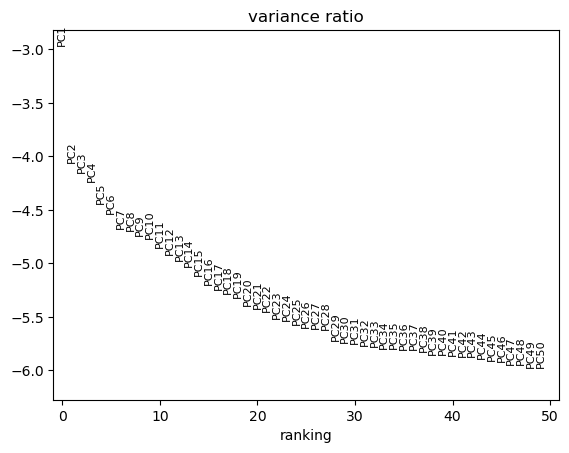

In [815]:
sc.pl.pca_variance_ratio(ST_sample, n_pcs=n_pcs, log=True)

# Clustering

In [819]:
pc_choice = 6
neighbor_numbers = 30
resl = 0.3

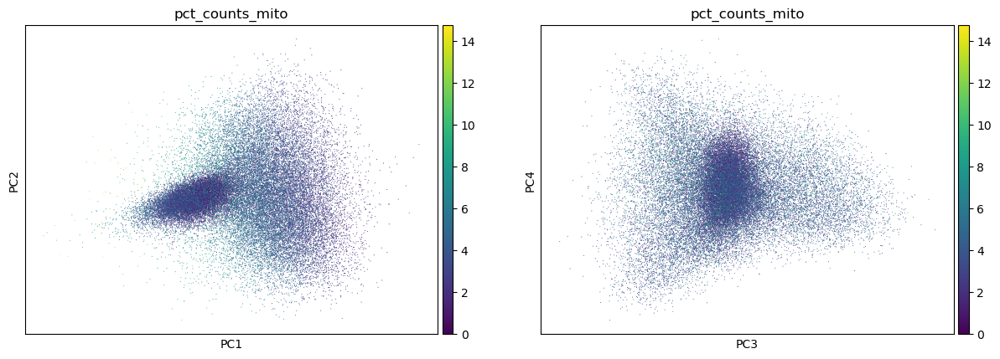

In [820]:
sc.pl.pca(
    ST_sample,
    color=["pct_counts_mito", "pct_counts_mito"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=2,
)

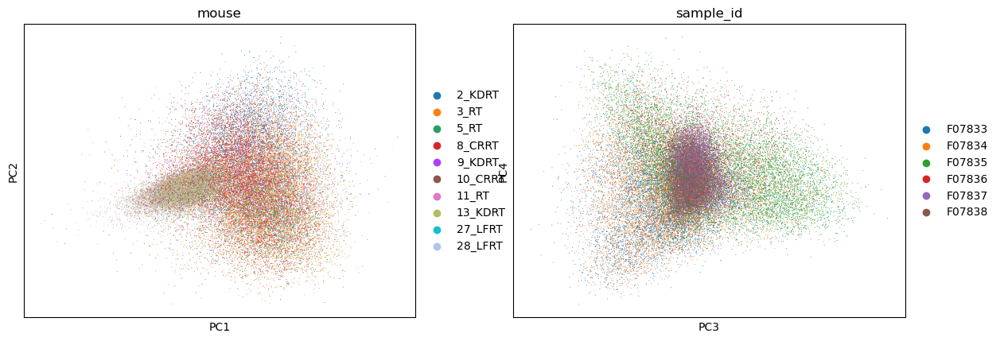

In [821]:
# First the categorical panels (no sorting needed)
sc.pl.pca(
    ST_sample,
    color=["mouse", "sample_id"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=2,
    sort_order=False,      # categorical won’t sort anyway
)

In [822]:
# # Integration

# sce.pp.harmony_integrate(
#     ST_sample,
#     key='sample_id',
#     basis='X_pca',
#     adjusted_basis='X_pca_harmony'
# )

# sc.pp.neighbors(
#     ST_sample,
#     n_neighbors=30,
#     n_pcs=pc_choice,
#     use_rep='X_pca_harmony',
#     transformer=AnnoyTransformer(n_trees=100),
#     method="umap",
#     knn=True
# )

In [823]:
# Memory efficient
sc.pp.neighbors(
    ST_sample,
    n_neighbors= neighbor_numbers,
    n_pcs=pc_choice,
    transformer=AnnoyTransformer(n_trees=100),
    method="umap",
    knn=True
)

## Resolution fine-tune

In [824]:
# resl = 0.5
sc.tl.leiden(
    ST_sample,
    resolution=resl,
    flavor="igraph",
    directed=False,    # Undirected - forces a two way link
    random_state=1337
)

In [825]:
sc.tl.umap(
    ST_sample,
    init_pos='random',  # instead of 'spectral'
)

## Visualization

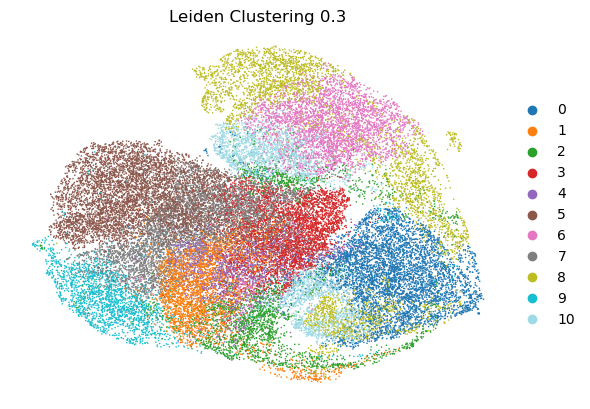

In [826]:
sc.pl.umap(
    ST_sample,
    color='leiden',    # color by your leiden clusters
    palette='tab20',   # nice large color palette
    size=5,            # small dots for large datasets (~1M cells)
    frameon=False,
    title=f'Leiden Clustering {resl}'
)

In [827]:
# sc.pl.umap(
#     ST_sample,
#     color='leiden',
#     groups=['1','10'],      # only these labels will be colored
#     palette=['purple','green'],  # match the order of your groups
#     size=20,
#     frameon=False,
#     title='Highlight Clusters'
# )

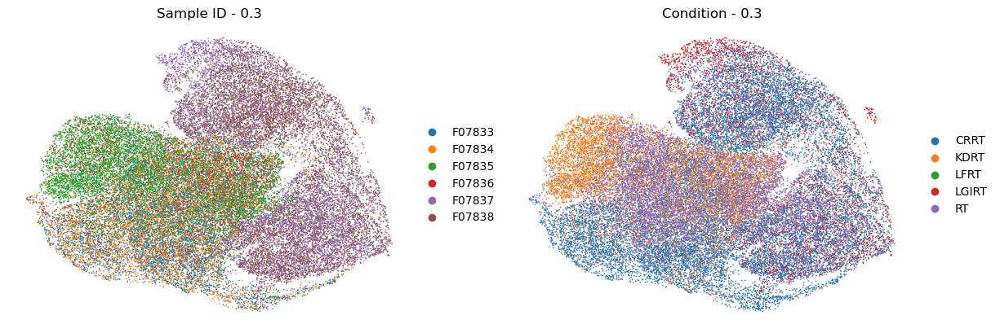

In [828]:
sc.pl.umap(
    ST_sample,
    color=['sample_id', 'condition'],
    ncols=3,            # one panel per key
    size=5,             # adjust dot size for visibility
    frameon=False,
    title=[f'Sample ID - {resl}', f'Condition - {resl}']
)


In [829]:
ST_sample.obs['sample_id'].unique()

['F07838', 'F07833', 'F07835', 'F07837', 'F07834', 'F07836']
Categories (6, object): ['F07833', 'F07834', 'F07835', 'F07836', 'F07837', 'F07838']

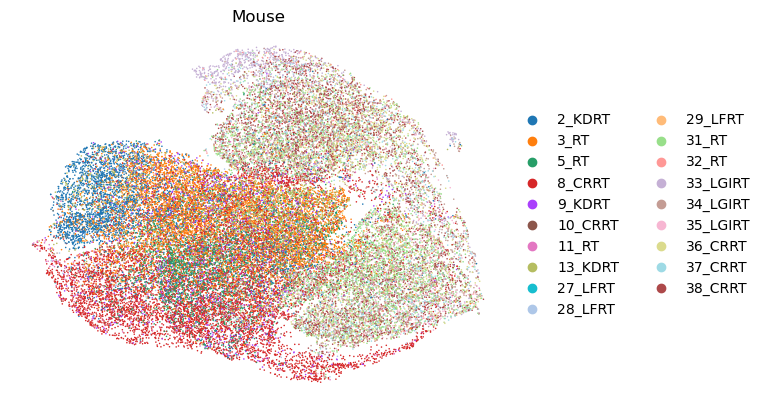

In [830]:
sc.pl.umap(
    ST_sample,
    color=['mouse'],
    ncols=3,            # one panel per key
    size=5,             # adjust dot size for visibility
    frameon=False,
    title=['Mouse']
)


In [831]:
ST_sample.obs['total_counts'].describe()

count    40000.000000
mean       339.202325
std        157.849044
min        200.000000
25%        239.000000
50%        293.000000
75%        386.000000
max       5046.000000
Name: total_counts, dtype: float64

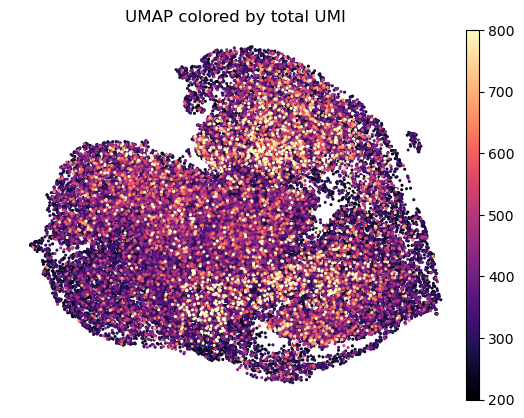

In [832]:
fig = sc.pl.umap(
    ST_sample,
    color='total_counts',
    cmap='magma',
    vmin=min_UMI, vmax=800,
    size=20,
    frameon=False,
    title='UMAP colored by total UMI',
    show=False,
    return_fig=True
)


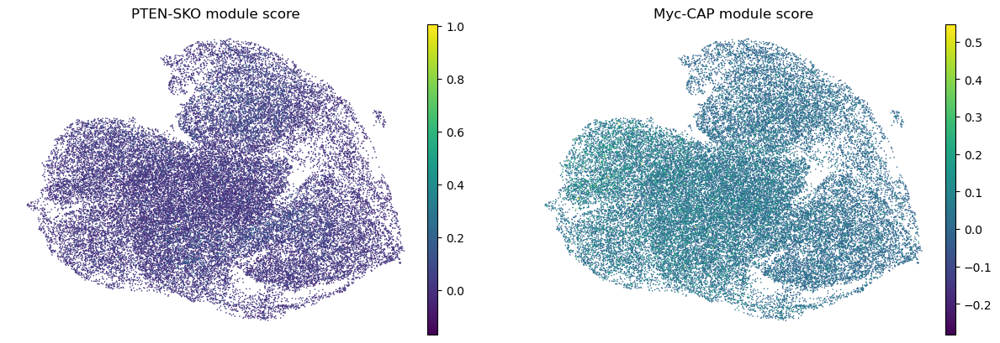

In [833]:
sc.pl.umap(
    ST_sample,
    color=["PTENSKO_score", "MycCAP_score"],
    size=5,
    frameon=False,
    cmap="viridis",
    title=["PTEN-SKO module score", "Myc-CAP module score"]
)

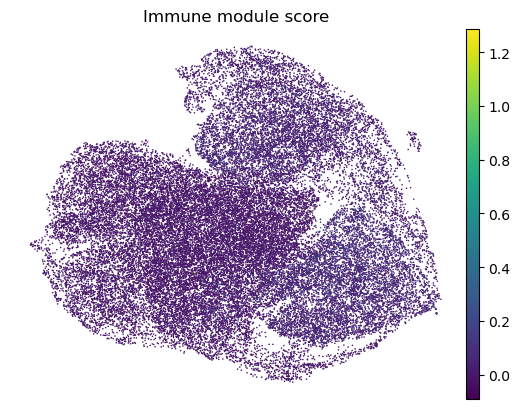

In [834]:
# UMAP overlay - Immune Score
sc.pl.umap(
    ST_sample,
    color="Immune_score",
    size=5,
    # vmin = 0.4,
    frameon=False,
    cmap="viridis",
    title="Immune module score"
)



In [835]:
# sc.pl.umap(
#     ST_sample,
#     color="Immune_score",
#     size=5,
#     frameon=False,
#     cmap="viridis",
#     title="Immune module score",
#     show=False  # Important: do not display immediately
# )

# # Save the current figure at 600 dpi
# fig_out = Path("/Users/janzules/Roselab/Spatial/dietary_project/figures/cell_segmentation_result_analysis/Improving_clustering/regress_test")
# fig_out.mkdir(parents=True, exist_ok=True)  # Ensure the directory exists

# plt.gcf().savefig(fig_out / "immune_module_score_umap.png", dpi=600, bbox_inches='tight')
# plt.close()

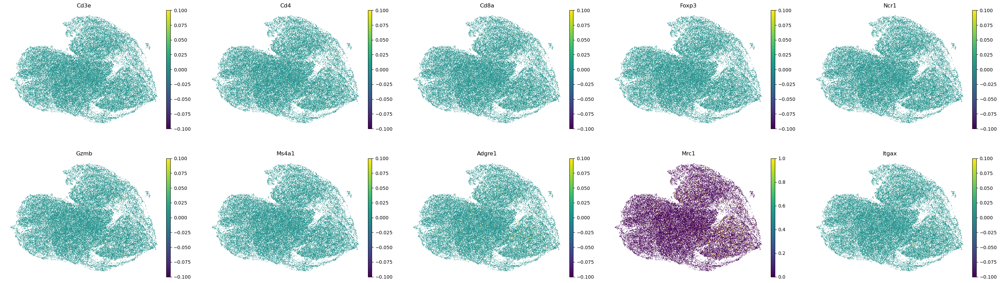

In [836]:
# Picked markers in the order you’d like them to appear left→right, top→bottom
genes_plot = [
    "Cd3e", "Cd4", "Cd8a", "Foxp3", "Ncr1",
    "Gzmb", "Ms4a1", "Adgre1", "Mrc1", "Itgax"
]

# Scanpy UMAP overlay
sc.pl.umap(
    ST_sample,
    color=genes_plot,
    ncols=5,                 # five panels per row → 2 rows for 10 genes
    size=5,                  # dot size – tweak for your DPI
    frameon=False,
    cmap="viridis",          # continuous colour map
    vmax="p99",              # clip extreme outliers for better contrast
    vmin="p01",
    layer = "counts",
    title=genes_plot         # one title per panel
)




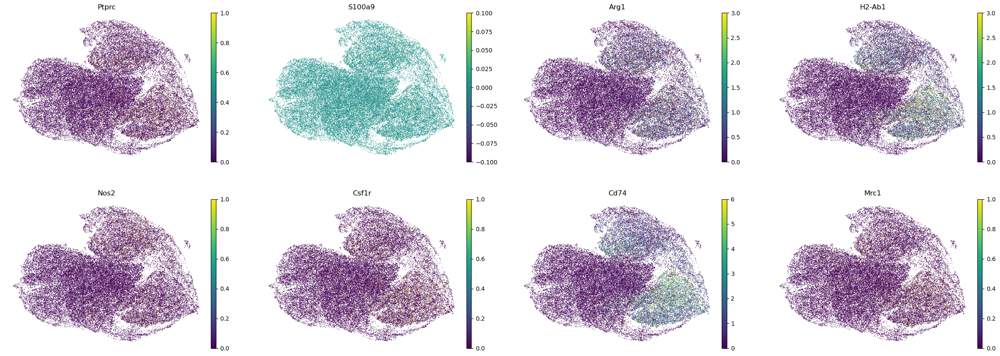

In [837]:
genes_seen = ["Ptprc", "S100a9", "Arg1", "H2-Ab1", "Nos2", "Csf1r", "Cd74", "Mrc1"]
# Scanpy UMAP overlay
sc.pl.umap(
    ST_sample,
    color=genes_seen,
    ncols=4,                 # five panels per row → 2 rows for 10 genes
    size=4,                  # dot size – tweak for your DPI
    frameon=False,
    cmap="viridis",          # continuous colour map
    vmax="p99",              # clip extreme outliers for better contrast
    vmin="p01",
    layer = "counts",
    title=genes_seen         # one title per panel
)


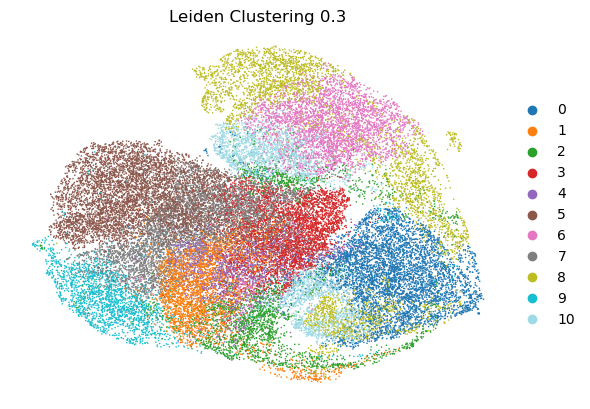

In [849]:
sc.pl.umap(
    ST_sample,
    color='leiden',    # color by your leiden clusters
    palette='tab20',   # nice large color palette
    size=5,            # small dots for large datasets (~1M cells)
    frameon=False,
    title=f'Leiden Clustering {resl}'
)

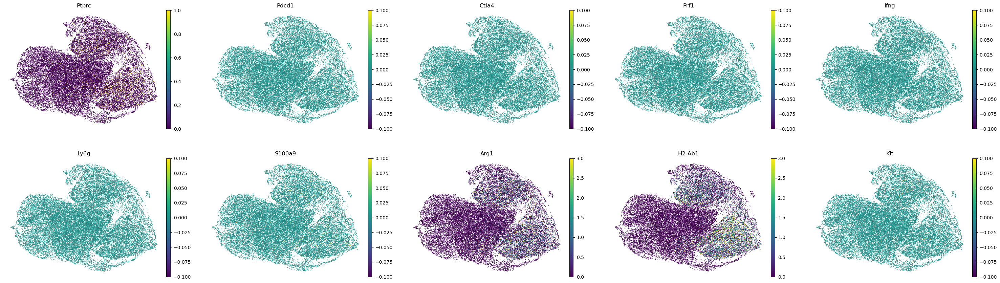

In [839]:
genes_plot2 = [
    "Ptprc", "Pdcd1", "Ctla4", "Prf1", "Ifng",
    "Ly6g",  "S100a9", "Arg1", "H2-Ab1", "Kit"
]



sc.pl.umap(
    ST_sample,
    color=genes_plot2,
    ncols=5,                 # 5 per row  → 2 rows
    size=5,
    frameon=False,
    cmap="viridis",
    vmax="p99",
    layer = "counts",
    title=genes_plot2
)


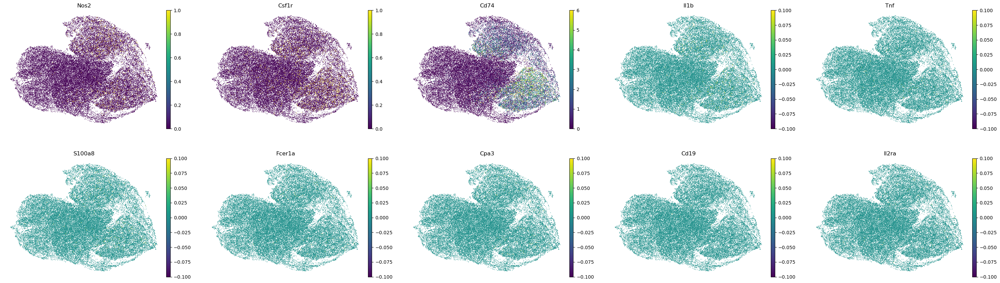

In [840]:
genes_plot3 = [
    "Nos2", "Csf1r", "Cd74", "Il1b", "Tnf",
    "S100a8", "Fcer1a", "Cpa3", "Cd19", "Il2ra"
]



sc.pl.umap(
    ST_sample,
    color=genes_plot3,
    ncols=5,
    size=5,
    frameon=False,
    cmap="viridis",
    vmax="p99",
    layer = "counts",
    title=genes_plot3
)

# Cluster Specific Analysis

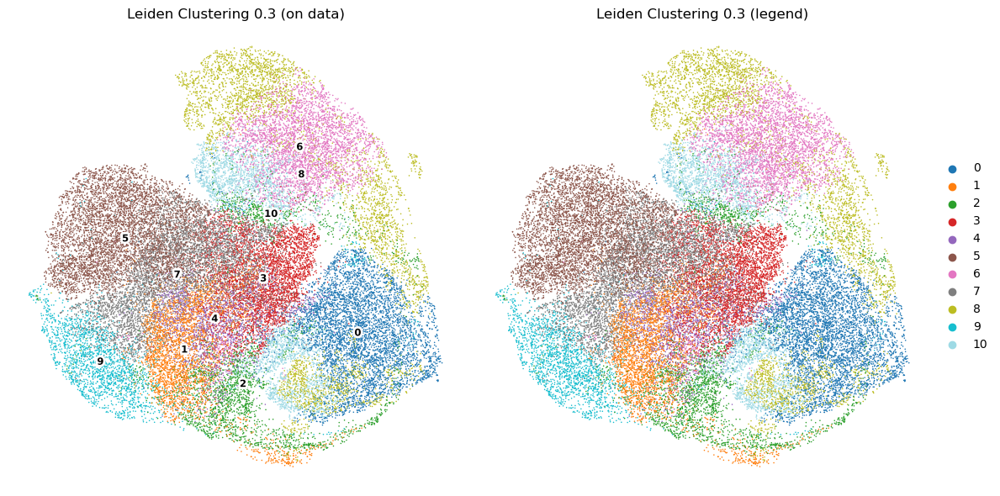

In [856]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Left plot: labels on UMAP
sc.pl.umap(
    ST_sample,
    color='leiden',
    palette='tab20',
    size=5,
    frameon=False,
    title=f'Leiden Clustering {resl} (on data)',
    legend_loc='on data',
    legend_fontsize='small',
    legend_fontoutline=4,
    ax=axs[0],
    show=False
)

# Right plot: regular legend
sc.pl.umap(
    ST_sample,
    color='leiden',
    palette='tab20',
    size=5,
    frameon=False,
    title=f'Leiden Clustering {resl} (legend)',
    ax=axs[1],
    show=False
)

plt.tight_layout()
plt.show()

In [877]:
# ───── your parameters ─────
cluster_of_interest = "0"      # the Leiden label you want to examine
groupby_key         = "leiden" # the obs column with cluster assignments
n_top               = 50       # how many top genes to return
method              = "wilcoxon"  # 't-test', 'wilcoxon', or 'logreg'
direction           = "up"     # "up", "down", or "all"
# ────────────────────────────

In [878]:
# 1) run ranking (if needed)
sc.tl.rank_genes_groups(
    ST_sample,
    groupby=groupby_key,
    groups=[cluster_of_interest],
    reference="rest",
    n_genes=n_top*100,            # pull extra so you can still get n_top after filtering
    method=method,
    key_added=f"rank_{cluster_of_interest}"
)

# 2) extract results
r      = ST_sample.uns[f"rank_{cluster_of_interest}"]
genes  = r["names"][cluster_of_interest]
pvals  = r["pvals"][cluster_of_interest]
padj   = r["pvals_adj"][cluster_of_interest]

top_genes = pd.DataFrame({
    "gene":     genes,
    "pval":     pvals,
    "pval_adj": padj
})

# 3) compute CPM-normalized log₂FC (as before)
mask   = ST_sample.obs[groupby_key] == cluster_of_interest
counts = ST_sample.layers["counts"]
counts_arr = counts.toarray() if issparse(counts) else counts.copy()
libsize    = counts_arr.sum(axis=1)
counts_cpm = (counts_arr.T / libsize).T * 1e6
mean_in    = counts_cpm[mask.values].mean(axis=0)
mean_out   = counts_cpm[~mask.values].mean(axis=0)
log2fc_all = np.log2((mean_in + 1.0) / (mean_out + 1.0))

top_genes["log2fc"] = [
    log2fc_all[ST_sample.var_names.get_loc(g)]
    for g in top_genes["gene"]
]

# 4) filter by direction and pick the top n_top
if direction.lower() == "up":
    selected = top_genes[top_genes.log2fc > 0] \
                   .nlargest(n_top, "log2fc")
elif direction.lower() == "down":
    selected = top_genes[top_genes.log2fc < 0] \
                   .nsmallest(n_top, "log2fc")
else:  # "all"
    selected = top_genes.head(n_top)

# 5) format p-values in scientific notation
pd.set_option('display.float_format', '{:.2e}'.format)
selected["pval"]     = selected["pval"].map(lambda x: f"{x:.2e}")
selected["pval_adj"] = selected["pval_adj"].map(lambda x: f"{x:.2e}")

print(selected)

/Users/janzules/anaconda3/envs/spatial_analysis_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


          gene       pval   pval_adj   log2fc
2026     Ccl22   0.00e+00   0.00e+00 2.88e+00
3       H2-Eb1   0.00e+00   0.00e+00 2.88e+00
1757  Pdcd1lg2  3.05e-303  1.27e-302 2.87e+00
333     H2-Ab1  7.20e-242  1.55e-241 2.73e+00
2        H2-Aa   0.00e+00   0.00e+00 2.70e+00
1         Cd74   0.00e+00   0.00e+00 2.58e+00
2033     Cxcr6   0.00e+00   0.00e+00 2.58e+00
306   Serpine3  1.85e-251  4.27e-251 2.55e+00
0         Apoe   0.00e+00   0.00e+00 2.48e+00
1427     Ctla4  3.03e-239  6.36e-239 2.47e+00
2058     Trbc2   0.00e+00   0.00e+00 2.41e+00
1988    Crabp1   0.00e+00   0.00e+00 2.40e+00
1909      Ly86   0.00e+00   0.00e+00 2.36e+00
2048      Trac   0.00e+00   0.00e+00 2.35e+00
2044      Penk   0.00e+00   0.00e+00 2.35e+00
1151     Cxcl9  7.03e-162  1.04e-161 2.34e+00
1662     Tnni3  1.32e-285  4.24e-285 2.33e+00
410       Lyz2  4.75e-202  8.09e-202 2.29e+00
2016     Gpm6b   0.00e+00   0.00e+00 2.27e+00
2037     Itgax   0.00e+00   0.00e+00 2.24e+00
2032    Dnaaf3   0.00e+00   0.00e+

In [898]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse
import scanpy as sc

# ─── parameters ───
cluster_of_interest = "0"      # Leiden cluster
groupby_key         = "leiden" # obs column
n_top               = 20       # how many to display in the notebook
n_enrich            = 200      # how many to send to enrichment (50–200 is typical)
method              = "wilcoxon"
direction           = "down"     # "up", "down", or "all"
# ────────────────────────

# run ranking
sc.tl.rank_genes_groups(
    ST_sample,
    groupby=groupby_key,
    groups=[cluster_of_interest],
    reference="rest",
    n_genes=n_enrich*10,            # pull extra so you still have n_enrich after filtering
    method=method,
    key_added=f"rank_{cluster_of_interest}"
)

# extract results
r      = ST_sample.uns[f"rank_{cluster_of_interest}"]
genes  = r["names"][cluster_of_interest]
pvals  = r["pvals"][cluster_of_interest]
padj   = r["pvals_adj"][cluster_of_interest]

top_genes = pd.DataFrame({
    "gene":     genes,
    "pval":     pvals,
    "pval_adj": padj
})

#  compute CPM‐normalized log₂FC
mask        = ST_sample.obs[groupby_key] == cluster_of_interest
counts      = ST_sample.layers["counts"]
counts_arr  = counts.toarray() if issparse(counts) else counts.copy()
libsize     = counts_arr.sum(axis=1)
counts_cpm  = (counts_arr.T / libsize).T * 1e6
mean_in     = counts_cpm[mask.values].mean(axis=0)
mean_out    = counts_cpm[~mask.values].mean(axis=0)
log2fc_all  = np.log2((mean_in + 1.0) / (mean_out + 1.0))

top_genes["log2fc"] = [
    log2fc_all[ST_sample.var_names.get_loc(g)]
    for g in top_genes["gene"]
]

# filter by direction & pick your enrichment set
if direction.lower() == "up":
    selected = (
        top_genes[top_genes.log2fc > 0]
        .nlargest(n_enrich, "log2fc")
    )
elif direction.lower() == "down":
    selected = (
        top_genes[top_genes.log2fc < 0]
        .nsmallest(n_enrich, "log2fc")
    )
else:  # "all"
    selected = top_genes.head(n_enrich)

# format p-values for readability
pd.set_option('display.float_format', '{:.2e}'.format)
selected["pval"]     = selected["pval"].map(lambda x: f"{x:.2e}")
selected["pval_adj"] = selected["pval_adj"].map(lambda x: f"{x:.2e}")

# pull out the gene list for enrichment
gene_list = selected["gene"].tolist()

print(f"Using {len(gene_list)} {direction}-regulated genes for enrichment:\n", selected)

# now you can feed `gene_list` straight into gseapy or enrichr:
# gp.enrichr(gene_list=gene_list, gene_sets=[...], organism="Mouse", outdir=None)


/Users/janzules/anaconda3/envs/spatial_analysis_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


Using 200 down-regulated genes for enrichment:
          gene       pval   pval_adj    log2fc
101      Ngfr   0.00e+00   0.00e+00 -8.24e+00
188    Mybpc1  4.49e-300  1.79e-299 -6.38e+00
9       Nalcn   0.00e+00   0.00e+00 -6.20e+00
147    Defb45   0.00e+00   0.00e+00 -6.15e+00
382     Adam7  2.20e-216  4.03e-216 -6.11e+00
..        ...        ...        ...       ...
448  Olfr1509  2.73e-175  4.24e-175 -2.72e+00
360     Nr1h5  1.04e-226  2.04e-226 -2.72e+00
106    Ifitm1   0.00e+00   0.00e+00 -2.72e+00
434      Cdon  1.45e-184  2.32e-184 -2.72e+00
686     Ttc22   3.81e-26   4.16e-26 -2.71e+00

[200 rows x 4 columns]


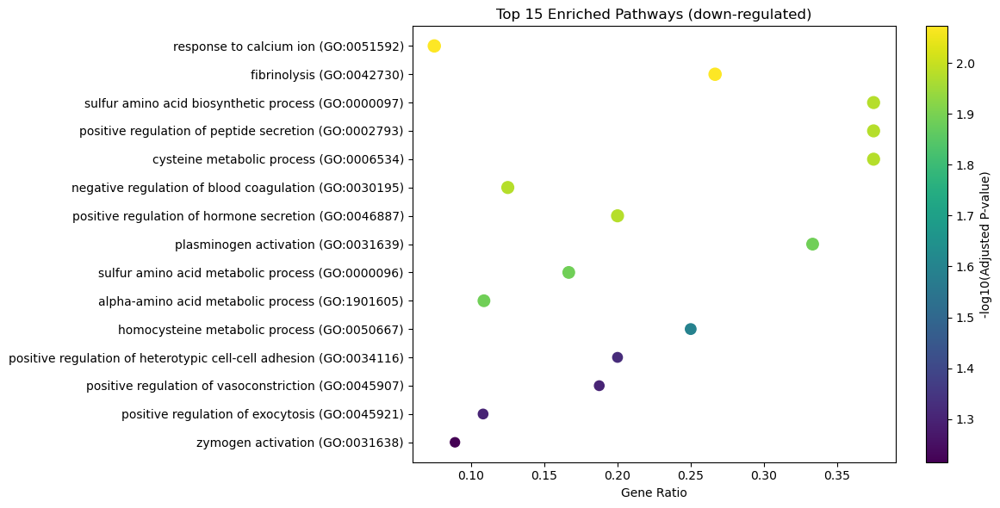

In [899]:
# ─── parameters ───────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import gseapy as gp

# gene_list = [...]          # from previous cell
n_pathways   = 15           # how many pathways to plot
gene_sets = ["GO_Biological_Process_2021"]
# gene_sets = ["WikiPathways_2024_Mouse"]
# gene_sets = ["Reactome_2022"]
# gene_sets    = ["KEGG_2019_Mouse"]  # or ["GO_Biological_Process_2021"], etc.
# ────────────────────────────────────────────────────────────────────────────────

# run Enrichr
enr = gp.enrichr(
    gene_list=gene_list,
    gene_sets=gene_sets,
    organism="Mouse",
    outdir=None,           # don’t write files to disk
)

#  pull results & select top n_pathways
res = enr.results.sort_values("Adjusted P-value").head(n_pathways)

# compute gene‐ratio and –log10(adj p)
#    Overlap is a string like "5/200"
res["Gene_Ratio"]      = res["Overlap"].apply(lambda x: int(x.split("/")[0]) / int(x.split("/")[1]))
res["neg_log10_padj"]  = -np.log10(res["Adjusted P-value"])


# ‒‒ choose width and height in inches
res = res.sort_values("neg_log10_padj", ascending=True)

# now plot exactly as before:
fig, ax = plt.subplots(figsize=(12, n_pathways * 0.4))
sc = ax.scatter(
    res["Gene_Ratio"],
    res["Term"],
    s=res["neg_log10_padj"] * 50,
    c=res["neg_log10_padj"],
    cmap="viridis",
)

ax.set_xlabel("Gene Ratio")
ax.set_title(f"Top {n_pathways} Enriched Pathways ({direction}-regulated)")
plt.colorbar(sc, ax=ax, label="-log10(Adjusted P-value)")

plt.tight_layout()
plt.show()

In [885]:
import gseapy as gp

# this returns a list of all Enrichr gene‐set libraries
all_libs = gp.get_library_name()
print(all_libs)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency_CellLines_2023', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and

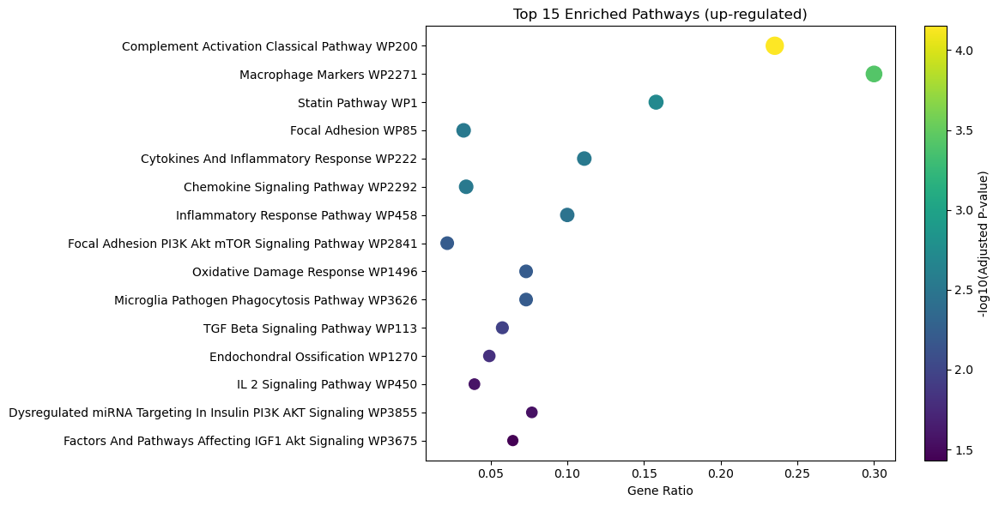

In [891]:
# ‒‒ choose width and height in inches
res = res.sort_values("neg_log10_padj", ascending=True)

# now plot exactly as before:
fig, ax = plt.subplots(figsize=(12, n_pathways * 0.4))
sc = ax.scatter(
    res["Gene_Ratio"],
    res["Term"],
    s=res["neg_log10_padj"] * 50,
    c=res["neg_log10_padj"],
    cmap="viridis",
)

ax.set_xlabel("Gene Ratio")
ax.set_title(f"Top {n_pathways} Enriched Pathways ({direction}-regulated)")
plt.colorbar(sc, ax=ax, label="-log10(Adjusted P-value)")

plt.tight_layout()
plt.show()

# Saving Immune images

In [843]:
# import scanpy as sc
# import matplotlib.pyplot as plt
# import numpy as np
# from pathlib import Path
# from matplotlib import rc_context

# # Set Scanpy output directory first
# fig_out = Path("/Users/janzules/Roselab/Spatial/dietary_project/figures/cell_segmentation_result_analysis/Improving_clustering/regress_test/Report")
# fig_out.mkdir(parents=True, exist_ok=True)
# sc.settings.figdir = fig_out  # <<-- MUST be set before plotting

# # Gene list
# genes_plot_low = [
#     "Cd3e", "Cd4", "Cd8a", "Foxp3", "Ncr1",
#     "Gzmb", "Ms4a1", "Adgre1", "Mrc1", "Itgax",
#     "Pdcd1", "Ctla4", "Prf1", "Ifng", "Ly6g",
#     "Tnf", "S100a8", "Fcer1a", "Cpa3", "Cd19", "Il2ra"
# ]

# # Threshold
# threshold = 0.01

# # Custom colormap with grey for NaNs
# cmap = plt.cm.viridis.copy()
# cmap.set_bad("lightgrey")

# # Loop through each gene
# for gene in genes_plot_low:
#     # Extract expression values
#     x = ST_sample.layers["counts"][:, ST_sample.var_names.get_loc(gene)].toarray().flatten()
    
#     # Apply threshold
#     x_masked = np.where(x < threshold, np.nan, x)
    
#     # Store temporarily in .obs
#     masked_key = f'{gene}_masked'
#     ST_sample.obs[masked_key] = x_masked

#     # Create figure with local 600 dpi save setting
#     with rc_context({'savefig.dpi': 600}):
#         sc.pl.umap(
#             ST_sample,
#             color=masked_key,
#             size=5,
#             frameon=False,
#             cmap=cmap,
#             title=gene,
#             save=f"cellmask_{gene}.png",  # No leading slash
#             show=False
#         )


# from matplotlib import rc_context

# genes_seen = ["Ptprc", "S100a9", "Arg1", "H2-Ab1", "Nos2", "Csf1r", "Cd74", "Mrc1"]

# # Make sure Scanpy is still pointing to the correct output directory
# sc.settings.figdir = fig_out

# # Save figure at 600 dpi without displaying
# with rc_context({'savefig.dpi': 600}):
#     sc.pl.umap(
#         ST_sample,
#         color=genes_seen,
#         ncols=4,
#         size=4,
#         frameon=False,
#         cmap="viridis",
#         vmax="p99",
#         vmin="p01",
#         layer="counts",
#         title=genes_seen,
#         save="genes_seen_umap.png",  # Saved inside fig_out
#         show=False
#     )


# with rc_context({'savefig.dpi': 600}):
#     sc.pl.umap(
#         ST_sample,
#         color='leiden',
#         palette='tab20',
#         size=5,
#         frameon=False,
#         title=f'Leiden Clustering {resl}',
#         save=f"leiden_clustering_resl.png",
#         show=False
#     )

# fig1 = sc.pl.umap(
#     ST_sample,
#     color=['sample_id', 'condition'],
#     ncols=2,
#     size=5,
#     frameon=False,
#     title=[f'Sample ID - {resl}', f'Condition - {resl}'],
#     show=False,
#     return_fig=True
# )
# fig1.savefig(fig_out / "sample_id_condition_umap.png", dpi=600, bbox_inches='tight')
# plt.close(fig1)

# # 2. Mouse
# fig2 = sc.pl.umap(
#     ST_sample,
#     color=['mouse'],
#     ncols=1,
#     size=5,
#     frameon=False,
#     title=['Mouse'],
#     show=False,
#     return_fig=True
# )
# fig2.savefig(fig_out / "mouse_umap.png", dpi=600, bbox_inches='tight')
# plt.close(fig2)

# # 3. Total UMIs
# fig3 = sc.pl.umap(
#     ST_sample,
#     color='total_counts',
#     cmap='magma',
#     vmin=min_UMI, vmax=800,
#     size=20,
#     frameon=False,
#     title='UMAP colored by total UMI',
#     show=False,
#     return_fig=True
# )
# fig3.savefig(fig_out / "total_umi_umap.png", dpi=600, bbox_inches='tight')
# plt.close(fig3)

# # 4. PTEN and Myc scores
# fig4 = sc.pl.umap(
#     ST_sample,
#     color=["PTENSKO_score", "MycCAP_score"],
#     size=5,
#     frameon=False,
#     cmap="viridis",
#     title=["PTEN-SKO module score", "Myc-CAP module score"],
#     show=False,
#     return_fig=True
# )
# fig4.savefig(fig_out / "pten_myc_module_score_umap.png", dpi=600, bbox_inches='tight')
# plt.close(fig4)



# # 1) Extract UMAP coords
# umap = ST_sample.obsm["X_umap"]
# x, y = umap[:,0], umap[:,1]

# # 2) Immune scores & mask
# immune_vals = ST_sample.obs["Immune_score"]
# threshold = 0.05               # change this to whatever cutoff you want
# low_mask  = immune_vals <= threshold
# high_mask = ~low_mask

# # 3) Make a normalizer for the “high” values
# vmin = immune_vals[high_mask].min()
# vmax = immune_vals.max()
# norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

# # 4) Plot grey points first
# fig, ax = plt.subplots(figsize=(8,6))
# ax.scatter(
#     x[low_mask], y[low_mask],
#     color="#D3D3D3",       # grey for everything ≤ threshold
#     s=5, linewidth=0
# )

# # 5) Plot colored points on top
# sc = ax.scatter(
#     x[high_mask], y[high_mask],
#     c=immune_vals[high_mask],
#     cmap="viridis",
#     norm=norm,
#     s=5, linewidth=0
# )

# # 6) Clean up axes
# ax.set_xticks([]); ax.set_yticks([])
# ax.set_frame_on(False)
# ax.set_title(f"Immune module score (grey ≤ {threshold})", fontsize=14)

# # 7) Add colorbar for the high‐score range
# cbar = fig.colorbar(sc, ax=ax, pad=0.01)
# cbar.set_label("Immune_score", rotation=270, labelpad=12)

# # 8) Save it
# fig_out.mkdir(parents=True, exist_ok=True)
# fig.savefig(fig_out / "immune_module_score_thresh_grey_umap.png",
#             dpi=600, bbox_inches="tight")
# plt.close(fig)